In [1]:
import pandas as pd
import pathlib
import h5py
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.optimize import curve_fit
import numpy as np
import tkinter as tk
from tkinter import filedialog
from sklearn.metrics import r2_score
from matplotlib.ticker import ScalarFormatter
from sklearn.linear_model import LinearRegression

def Select_files():
    # Create a Tkinter root window, but keep it hidden
    root = tk.Tk()

    # Open a file selection dialog
    file_paths = filedialog.askopenfilenames()

    # Convert the selected file paths into Path objects
    file_paths = [pathlib.Path(file) for file in file_paths]

    root.withdraw()

    return file_paths

Temperature=[10, 15, 20, 25, 30]
files_1=[]
for i, temp in enumerate(Temperature):
    file=Select_files()
    files_1.append(file)
files_2=[]
for i, temp in enumerate(Temperature):
    file=Select_files()
    files_2.append(file)
print(files)

NameError: name 'files' is not defined

C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_8292\3739465250.py:127: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  df=pd.read_csv(file)


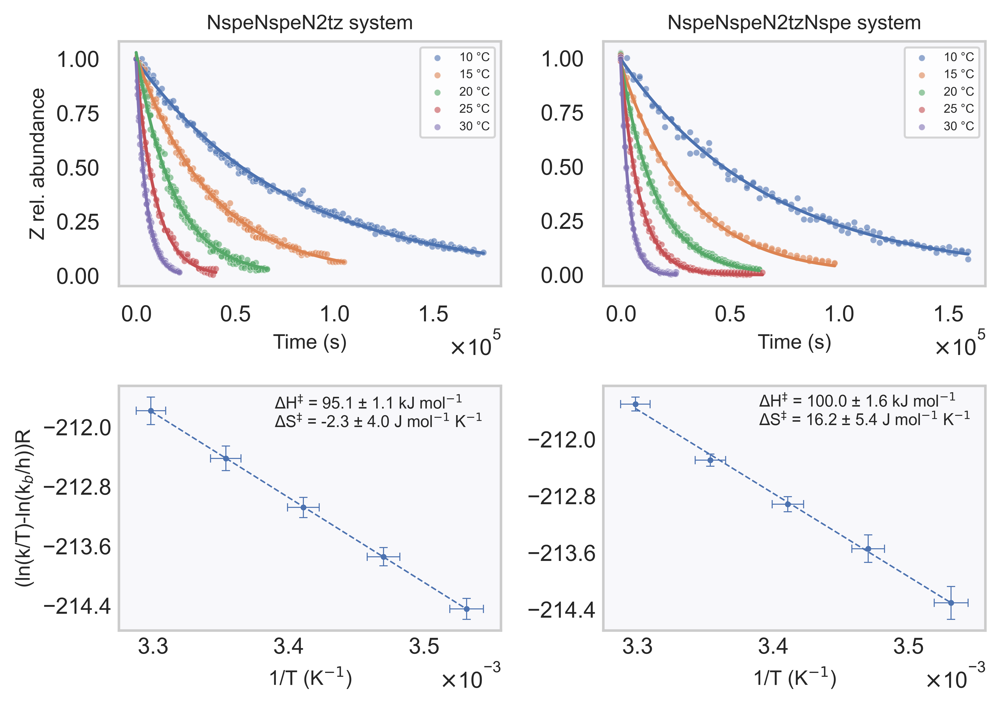

In [80]:
import pandas as pd
import pathlib
import h5py
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.optimize import curve_fit
import numpy as np
import tkinter as tk
from tkinter import filedialog
from sklearn.metrics import r2_score
from matplotlib.ticker import MaxNLocator, AutoMinorLocator, ScalarFormatter, FuncFormatter, MultipleLocator
from sklearn.linear_model import LinearRegression

R = 8.314
t = 0.650
h = 6.63E-34
kb = 1.38E-23
e = 1.602E-19

def exponential_decay(x, a, k, c):
    x=list(x)
    x=[float(x) for x in x]
    x=np.array(x)
    return a * np.exp(-k * x) + c

def two_exponential_decay(x, a_1, k_1, a_2, k_2, c):
    return a_1 * np.exp(-k_1 * x) + a_2 * np.exp(-k_2 * x) + c

def fit_exponential_decay(x, y, **kwargs):
    k_guess = (y.max()-y.min())/(x.max()-x.min())
    initial_guess = [1, k_guess, 0]
    bounds=[[-np.inf, -np.inf, -np.inf], [np.inf, np.inf, np.inf]]
    y0=kwargs.pop("y0", None)
    if y0!=None:
        bounds[0][2]=y0-1E-5
        bounds[1][2]=y0+1E-5
    popt, pcov = curve_fit(exponential_decay, x, y, p0=initial_guess, bounds=bounds, maxfev = 1000000)
    perr = np.sqrt(np.diag(pcov))
    rep = "##############################"
    rep += "\nTwo-state exponential decay fit"
    rep += "\nA = {:.2e} \u00B1 {:.2e}".format(popt[0], perr[0])
    rep += "\nk = {:.2e} \u00B1 {:.2e}".format(popt[1], perr[1])
    if y0==None:
        rep += "\ny0 = {:.2e} \u00B1 {:.2e}".format(popt[2], perr[2])
    else:
        rep += "\ny0 = {:.2e}".format(y0)
    y_R2 = exponential_decay(x, *popt)
    rep += "\nR² = {:.3f}".format(r2_score(y, y_R2))
    rep += "\nExponential decay Equation: y = A*exp(-k*x) + y0"
    rep += "\n##############################"
    return popt, perr, rep

def fit_data_iterative(x_list, y_list, df=None, fit_type="line", r2_threshold=0.97, **kwargs):
    x = np.array(x_list)
    y = np.array(y_list)
    
    y0=kwargs.pop("y0", None)
    
    removed_points = []  # Keep track of removed points
    current_r2 = 0

    while current_r2 < r2_threshold and len(x) > 2:
        if fit_type == "line":
            # Fit line using OLS
            X = sm.add_constant(x)  # Add a constant term for the intercept
            model = sm.OLS(y, X).fit()
            predictions = model.predict(sm.add_constant(x))
            residuals = np.abs(y - predictions)
            current_r2 = model.rsquared
            
            # Print the linear equation
            intercept = model.params[0]
            slope = model.params[1]
        
        elif fit_type == "sigmoid":
            # Fit sigmoid using curve fitting
            (L, x0, k, b), pcov = fit_sigmoid(x, y)
            predictions = sigmoid(x, L, x0, k, b)
            residuals = np.abs(y - predictions)
            current_r2 = r2_score(y, predictions)
         
        elif fit_type=="monoexponential_decay":
            popt, pcov,_=fit_exponential_decay(x, y, y0=y0)
            predictions=exponential_decay(x, *popt)
            residuals = np.abs(y - predictions)
            current_r2 = r2_score(y, predictions)
            #print(current_r2)
            
        # If R² is good enough, stop
        if current_r2 >= r2_threshold:
            break

        # Identify the worst point (largest residual)
        worst_point_index = np.argmax(residuals)

        if df is None:
            removed_points.append(worst_point_index)

        if df is not None:
            original_index = df.index[worst_point_index]  # Get original index
            removed_points.append(original_index)
            df = df.drop(index=original_index)

        # Remove the worst point
        x = np.delete(x, worst_point_index)
        y = np.delete(y, worst_point_index)
    
    if df is not None:
        return x, y, df
    
    else:
        return x, y

fig, axes = plt.subplots(2, 2, figsize=(7, 5), dpi=600)
sns.set(style="whitegrid")

system = "NspeNspeN2tz"
Temperature=[10, 15, 20, 25, 30]
k=[]
k_errors=[]
files=files_1
for i, temp in enumerate(Temperature):
    ax = axes[0, 0]
    dfi=[]
    T_files=files[i]
    for j,file in enumerate(T_files):
        df=pd.read_csv(file)
        dfi.append(df)
    df=pd.concat([dfi for dfi in dfi], ignore_index=True)
    df=df[["Time", "Z"]]
    df=df.dropna()
    x,y,df=fit_data_iterative(df["Time"].values, df["Z"].values, df=df, fit_type="monoexponential_decay", r2_threshold=0.99, y0=0)
    #sns.scatterplot(data=df, x="Time", y="Z", label=f'{float(temp)} °C', ax=axes[0, 0])
    sns.scatterplot(x=x, y=y, label=f'{int(temp)} °C',s=10, ax=axes[0, 0], alpha=0.6)
    popt, perr, rep=fit_exponential_decay(x, y, y0=0)
    x_fit=np.linspace(df["Time"].min(), df["Time"].max(), 2000)
    y_fit=exponential_decay(x_fit, popt[0], popt[1], popt[2])
    sns.lineplot(x=x_fit, y=y_fit, ax=axes[0, 0])
    #ax.set_xscale("log")
    ax.set_title(f'{system} system', fontsize=10)
    ax.set_xlabel('Time (s)', fontsize=10)
    ax.set_ylabel('Z rel. abundance', fontsize=10)
    ax.xaxis.set_major_formatter(ScalarFormatter(useMathText=True))
    ax.ticklabel_format(style='sci', axis='x', scilimits=(0,0))
    ax.legend(fontsize=6)
    ax.grid(False)
    ax.set_facecolor('#F8F8FB')
    k.append(popt[1])
    k_errors.append(perr[1])

x_Eyring= []
y_Eyring= []
y_errors=[]
Temperature=[temp+273.15 for temp in Temperature]
T_errors=[]
for i, temp in enumerate(Temperature):
    T_errors.append(1/(temp**2))
    temp=1/temp
    x_Eyring.append(temp)
    y=(np.log(k[i]*temp)-np.log(kb/h)*R)
    y_Eyring.append(y)
    y_errors.append((np.sqrt((k_errors[i]/k[i])**2)+((T_errors[i]/Temperature[i])**2))*R)
x = np.array(x_Eyring).reshape(-1, 1)  # Reshape to 2D array (required by sklearn)
y = np.array(y_Eyring)
model = LinearRegression()
model.fit(x, y)
slope = model.coef_[0]
intercept = model.intercept_

ax=axes[1, 0]
x_fit=np.linspace(min(x_Eyring), max(x_Eyring), 2000)
y_fit=x_fit*slope+intercept
sns.lineplot(x=x_fit, y=y_fit, size=5, linestyle='--', ax=ax)
ax.errorbar(x_Eyring, y_Eyring, xerr=T_errors, yerr=y_errors, fmt='none', color='b', elinewidth=0.5, capsize=2, capthick=0.5)
sns.scatterplot(x=x_Eyring, y=y_Eyring, s=10, color='b', ax=ax)
ax.set_xlabel('1/T (K$^{-1}$)', fontsize=10)
ax.set_ylabel('(ln(k/T)-ln(k$_{b}$/h))R', fontsize=10)
ax.xaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax.ticklabel_format(style='sci', axis='x', scilimits=(0,0))
ax.text(3.390E-3, -212, "\u0394H$^\u2021$ = 95.1 \u00B1 1.1 kJ mol$^{-1}$ \n\u0394S$^\u2021$ = -2.3 \u00B1 4.0 J mol$^{-1}$ K$^{-1}$", fontsize=8)
ax.get_legend().remove()
ax.set_facecolor('#F8F8FB')
ax.grid(False)
ax.tick_params(axis='both', which='both', length=0)
ax.yaxis.set_major_formatter(ScalarFormatter(useOffset=False))
ax.yaxis.set_major_locator(MaxNLocator(nbins=5))

# ax2=axes[1, 0].twinx()
# hlt=np.log(2)/k
# hlt=hlt/3600
# hlt=[float(hlt) for hlt in hlt] 
# ax2.set_ylim(max(hlt), min(hlt))
# ax2.grid(False)
# ax2.tick_params(axis='both', which='both', length=0)
# #ax2.yaxis.set_major_formatter(ScalarFormatter(useOffset=False))
# #ax2.xaxis.set_major_formatter(ScalarFormatter(useMathText=True))
# #ax2.ticklabel_format(style='sci', axis='x', scilimits=(0,0))
# ax2.yaxis.set_major_locator(MultipleLocator(2.5))
# def format_as_float(x, pos):
#     return f'{x:.1f}'  # Format as float with 2 decimal places
# ax2.yaxis.set_major_formatter(FuncFormatter(format_as_float))

# ax3=axes[1, 0].twiny()
# Temperature=[1/x for x in x_Eyring]
# Temperature=[temp-273.15 for temp in Temperature]
# ax3.set_ylim(min(Temperature), max(Temperature))
# ax3.set_ylabel(r'Temperature (°C)')
# ax3.grid(False)
# ax3.tick_params(axis='both', which='both', length=0)

#ax2.yaxis.set_major_formatter(ScalarFormatter(useOffset=False))
#ax2.xaxis.set_major_formatter(ScalarFormatter(useMathText=True))
#ax2.ticklabel_format(style='sci', axis='x', scilimits=(0,0))
#ax2.yaxis.set_major_locator(MultipleLocator(2.5))
#def format_as_float(x, pos):
    #return f'{x:.1f}'  # Format as float with 2 decimal places
#ax2.yaxis.set_major_formatter(FuncFormatter(format_as_float))

system = "NspeN2tzNspeNspe"
Temperature=[10, 15, 20, 25, 30]
k=[]
k_errors=[]
files=files_2
for i, temp in enumerate(Temperature):
    ax = axes[0, 1]
    dfi=[]
    T_files=files[i]
    for j,file in enumerate(T_files):
        df=pd.read_csv(file)
        dfi.append(df)
    df=pd.concat([dfi for dfi in dfi], ignore_index=True)
    df.dropna()
    x,y,df=fit_data_iterative(df["Time"].values, df["Z"].values, df=df, fit_type="monoexponential_decay", r2_threshold=0.99, y0=0)
    #sns.scatterplot(data=df, x="Time", y="Z", label=f'{float(temp)} °C', ax=axes[0, 0])
    sns.scatterplot(x=x, y=y, label=f'{int(temp)} °C',s=10, ax=axes[0, 1], alpha=0.6)
    popt, perr, rep=fit_exponential_decay(x, y, y0=0)
    x_fit=np.linspace(df["Time"].min(), df["Time"].max(), 2000)
    y_fit=exponential_decay(x_fit, popt[0], popt[1], popt[2])
    sns.lineplot(x=x_fit, y=y_fit, ax=axes[0, 1])
    #ax.set_xscale("log")
    ax.set_title(f'{system} system', fontsize=10)
    ax.set_xlabel('Time (s)', fontsize=10)
    ax.xaxis.set_major_formatter(ScalarFormatter(useMathText=True))
    ax.ticklabel_format(style='sci', axis='x', scilimits=(0,0))
    ax.legend(fontsize=6)
    ax.grid(False)
    ax.set_facecolor('#F8F8FB')
    k.append(popt[1])
    k_errors.append(perr[1])

x_Eyring= []
y_Eyring= []
y_errors=[]
Temperature=[temp+273.15 for temp in Temperature]
T_errors=[]
for i, temp in enumerate(Temperature):
    T_errors.append(1/(temp**2))
    temp=1/temp
    x_Eyring.append(temp)
    y=(np.log(k[i]*temp)-np.log(kb/h)*R)
    y_Eyring.append(y)
    y_errors.append((np.sqrt((k_errors[i]/k[i])**2)+((T_errors[i]/Temperature[i])**2))*R)
x = np.array(x_Eyring).reshape(-1, 1)  # Reshape to 2D array (required by sklearn)
y = np.array(y_Eyring)
model = LinearRegression()
model.fit(x, y)
slope = model.coef_[0]
intercept = model.intercept_

ax=axes[1, 1]
x_fit=np.linspace(min(x_Eyring), max(x_Eyring), 2000)
y_fit=x_fit*slope+intercept
sns.lineplot(x=x_fit, y=y_fit, size=5, linestyle='--', ax=ax)
ax.errorbar(x_Eyring, y_Eyring, xerr=T_errors, yerr=y_errors, fmt='none', color='b', elinewidth=0.5, capsize=2, capthick=0.5)
sns.scatterplot(x=x_Eyring, y=y_Eyring, s=10, color='b', ax=ax)
ax.set_xlabel('1/T (K$^{-1}$)', fontsize=10)
ax.xaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax.ticklabel_format(style='sci', axis='x', scilimits=(0,0))
ax.text(3.390E-3, -211.8, "\u0394H$^\u2021$ = 100.0 \u00B1 1.6 kJ mol$^{-1}$ \n\u0394S$^\u2021$ = 16.2 \u00B1 5.4 J mol$^{-1}$ K$^{-1}$", fontsize=8)
ax.get_legend().remove()
ax.set_facecolor('#F8F8FB')
ax.grid(False)
ax.tick_params(axis='both', which='both', length=0)
ax.yaxis.set_major_formatter(ScalarFormatter(useOffset=False))
ax.yaxis.set_major_locator(MaxNLocator(nbins=5))
# ax2=axes[1, 1].twinx()
# hlt=np.log(2)/k
# hlt=hlt/3600
# ax2.set_ylim(max(hlt), min(hlt))
# ax2.set_ylabel(r'Half-life time (h)')
# ax2.grid(False)
# ax2.tick_params(axis='both', which='both', length=0)
# ax2.yaxis.set_major_formatter(ScalarFormatter(useOffset=False))
# Adjust layout for better spacing
plt.tight_layout()

# Save the high-quality figure
plt.savefig(pathlib.Path(r'C:\Users\Thomas\Documents\#UMONS\FRIA\Data\Paper 1\Eyring_plots_Figure\Eyring_plots_Figure.png'), dpi=600)
plt.savefig(pathlib.Path(r'C:\Users\Thomas\Documents\#UMONS\FRIA\Data\Paper 1\Eyring_plots_Figure\Eyring_plots_Figure.svg'), dpi=600)

# Show the plot
plt.show()

In [17]:
x=[2, 5, 7, 9]
x=np.array(x)
x=list(x)
x=[float(x) for x in x]
print(x)
print(type(x))
print(type(x[0]))

[2.0, 5.0, 7.0, 9.0]
<class 'list'>
<class 'float'>


In [1]:
import pandas as pd
import pathlib
import h5py
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.optimize import curve_fit
import numpy as np
import tkinter as tk
from tkinter import filedialog
from sklearn.metrics import r2_score
from matplotlib.ticker import ScalarFormatter
from sklearn.linear_model import LinearRegression
from matplotlib.ticker import ScalarFormatter, StrMethodFormatter
def exponential_decay(x, k):
    return 0.9 * np.exp(-k * x)
def line(x, m, p):
    return m * x + p

0.9556106035067539
0.9258653863846611
0.9851851463467654
0.9938867511153348
0.9906989817037923
0.9743367975512602


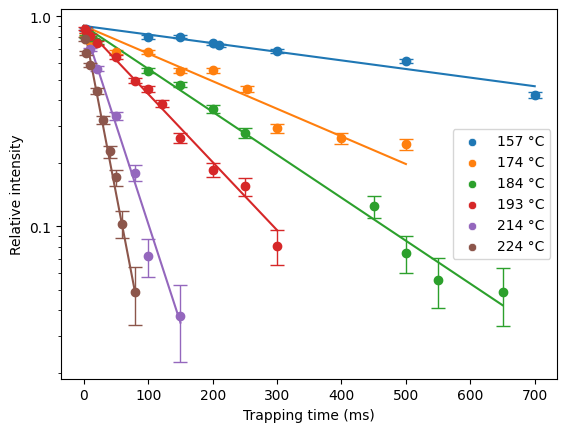

In [2]:
DIR=pathlib.Path(r'C:\Users\Thomas\Documents\#UMONS\FRIA\Data\Paper 1\Eyring_plots_Figure\NspeNspeN2tz\NspeNspeN2tz_H_data.h5')
with pd.HDFStore(DIR) as hdf:
    key_list = hdf.keys()
fig, ax = plt.subplots()
for key in key_list:
    T = key[1:]
    df = pd.read_hdf(DIR, key = f'{T}')
    df['Error'] = 0.015
    if int(float(T)) == 193:
        df = df.drop([12])
    if int(float(T)) == 214:
        df = df.drop([3])
        df.loc[6, 'Relative intensity'] = df.loc[6, 'Relative intensity'] + 0.025
    x = df['Trapping time'].to_numpy()
    y = df['Relative intensity'].to_numpy()
    guess = [0.003806013768452711]
    popt, pcov = curve_fit(exponential_decay, x, y, p0=guess, maxfev=10000)
    x_fit = np.linspace(0, x.max(), 2000)
    y_fit = exponential_decay(x_fit, *popt)
    y_r2 = exponential_decay(x, *popt)
    print(r2_score(y_r2, y))
    #sns.lineplot(x=x_fit, y=y_fit, color=colors[i], linewidth=2)
    sns.lineplot(x=x_fit, y=y_fit)
    #df['Relative intensity'] = np.log(df['Relative intensity'])
    #sns.scatterplot(data=df, x='Trapping time', y='Relative intensity', label=f'{int(T) + 273} K', color=colors[i])
    sns.scatterplot(data=df, x='Trapping time', y='Relative intensity', label=f'{int(float(T))} °C', ax=ax)
    line_color = ax.get_lines()[-1].get_color()
    plt.errorbar(df['Trapping time'], df['Relative intensity'], yerr=df['Error'], fmt='o', color=line_color, capsize=5, capthick=1, elinewidth=1)
plt.yscale('log')
plt.gca().yaxis.set_major_formatter(ScalarFormatter())
plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:.1f}'))
ax.set_xlabel('Trapping time (ms)')
ax.set_ylabel('Relative intensity')
plt.show()

In [1]:
import pandas as pd
import pathlib
import h5py
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.optimize import curve_fit
import numpy as np
import tkinter as tk
from tkinter import filedialog
from sklearn.metrics import r2_score
from matplotlib.ticker import ScalarFormatter
from sklearn.linear_model import LinearRegression

def Select_files():
    # Create a Tkinter root window, but keep it hidden
    root = tk.Tk()

    # Open a file selection dialog
    file_paths = filedialog.askopenfilenames()

    # Convert the selected file paths into Path objects
    file_paths = [pathlib.Path(file) for file in file_paths]

    root.withdraw()

    return file_paths

# Temperature=[10, 15, 20, 25, 30]
# files_1=[]
# for i, temp in enumerate(Temperature):
#     file=Select_files()
#     files_1.append(file)

Temperature=[157, 174, 184, 193, 214, 224]
files_2=[]
for i, temp in enumerate(Temperature):
    file=Select_files()
    files_2.append(file)

In [4]:
Temperature=[10, 15, 20, 25, 30]
files_1=[]
for i, temp in enumerate(Temperature):
    file=Select_files()
    files_1.append(file)

In [24]:
files_2[1]=Select_files()

C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_9376\2700144736.py:24: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  df=pd.read_csv(file)


Slope: -94936.931 ± 319.878
Intercept: -2.857 ± 1.092
Slope: -94345.452 ± 4270.671
Intercept: -31.311 ± 9.234


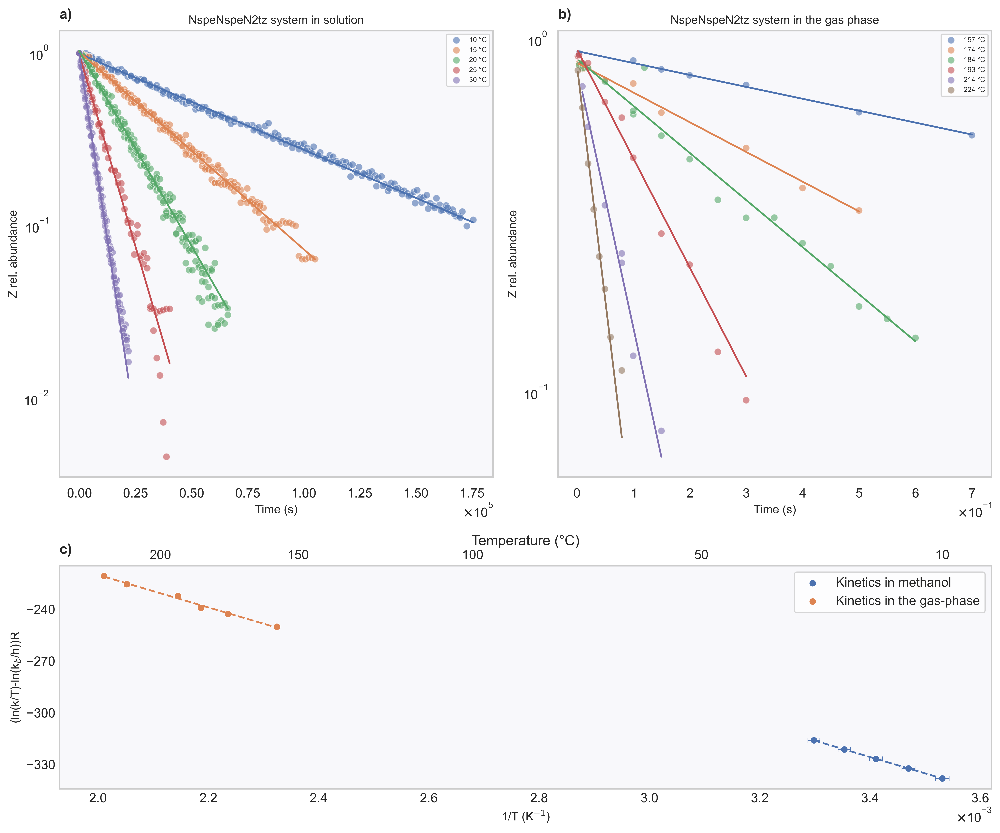

In [6]:
from KIMETICS import *
from matplotlib.ticker import MaxNLocator, AutoMinorLocator, ScalarFormatter, FuncFormatter, MultipleLocator
from sklearn.linear_model import LinearRegression

# fig, axes = plt.subplots(2, 2, figsize=(7, 5), dpi=600)
fig = plt.figure(figsize=(12, 10), dpi=600)
gs = fig.add_gridspec(2, 2, height_ratios=[1, 0.5])
sns.set(style="whitegrid")
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[1, :])
axes=[ax1, ax2, ax3]

system = "NspeNspeN2tz"
Temperature=[10, 15, 20, 25, 30]
k=[]
k_errors=[]
files=files_1
for i, temp in enumerate(Temperature):
    ax = ax1
    dfi=[]
    T_files=files[i]
    for j,file in enumerate(T_files):
        df=pd.read_csv(file)
        dfi.append(df)
    df=pd.concat([dfi for dfi in dfi], ignore_index=True)
    df=df[["Time", "Z"]]
    df=df.dropna()
    #x,y,df=fit_data_iterative(df["Time"].values, df["Z"].values, df=df, fit_type="monoexponential_decay", r2_threshold=0.99)
    sns.scatterplot(data=df, x="Time", y="Z", label=f'{int(temp)} °C', ax=ax1, alpha=0.6)
    x, y=df["Time"].to_list(), df["Z"].to_list()
    #sns.scatterplot(x=x, y=y, label=f'{int(temp)} °C',s=10, ax=axes[0, 0], alpha=0.6)
    popt, perr, rep, r2=fit_exponential_decay(x, y, y0=0)
    x_fit=np.linspace(df["Time"].min(), df["Time"].max(), 2000)
    y_fit=exponential_decay(x_fit, popt[0], popt[1], popt[2])
    sns.lineplot(x=x_fit, y=y_fit, ax=ax1)
    #ax.set_xscale("log")
    ax.set_title(f'{system} system in solution', fontsize=10)
    ax.set_xlabel('Time (s)', fontsize=10)
    ax.set_ylabel('Z rel. abundance', fontsize=10)
    ax.xaxis.set_major_formatter(ScalarFormatter(useMathText=True))
    ax.ticklabel_format(style='sci', axis='x', scilimits=(0,0))
    ax.legend(fontsize=6)
    ax.grid(False)
    ax.set_facecolor('#F8F8FB')
    ax.set_yscale('log')
    k.append(popt[1])
    k_errors.append(perr[1])

x_Eyring= []
y_Eyring= []
y_errors=[]
Temperature=[temp+273.15 for temp in Temperature]
T_errors=[]
for i, temp in enumerate(Temperature):
    T_errors.append(1/(temp**2))
    temp=1/temp
    x_Eyring.append(temp)
    y=(np.log(k[i]*temp)-np.log(kb/h))*R
    y_Eyring.append(y)
    y_errors.append((np.sqrt((k_errors[i]/k[i])**2)+((T_errors[i]/Temperature[i])**2))*R)
x = np.array(x_Eyring).reshape(-1, 1)  # Reshape to 2D array (required by sklearn)
y = np.array(y_Eyring)
model = LinearRegression()
model.fit(x, y)
slope = model.coef_[0]
intercept = model.intercept_

y_pred = model.predict(x)
residuals = y - y_pred
n = len(y)  # Number of data points
p = 2       # Number of parameters (slope and intercept)
residual_variance = np.sum(residuals**2) / (n - p)
X = np.column_stack((np.ones_like(x), x))
XTX_inv = np.linalg.inv(X.T @ X)
param_covariance = residual_variance * XTX_inv
intercept_error = np.sqrt(param_covariance[0, 0])
slope_error = np.sqrt(param_covariance[1, 1])

print(f"Slope: {slope:.3f} ± {slope_error:.3f}")
print(f"Intercept: {intercept:.3f} ± {intercept_error:.3f}")

ax=ax3
x_fit=np.linspace(min(x_Eyring), max(x_Eyring), 2000)
y_fit=x_fit*slope+intercept
sns.lineplot(x=x_fit, y=y_fit, linestyle='--', ax=ax)
ax.errorbar(x_Eyring, y_Eyring, xerr=T_errors, yerr=y_errors, fmt='none', elinewidth=0.5, capsize=2, capthick=0.5)
sns.scatterplot(x=x_Eyring, y=y_Eyring, ax=ax, label="Kinetics in methanol")

system = "NspeNspeN2tz"
Temperature=[157, 174, 184, 193, 214, 224]
# Temperature=[184, 193, 214, 224]
k=[]
k_errors=[]
DIR=pathlib.Path(r'C:\Users\Thomas\Documents\#UMONS\FRIA\Data\Paper 1\Eyring_plots_Figure\NspeNspeN2tz\NspeNspeN2tz_H_data.h5')
for i, temp in enumerate(Temperature):
    ax = ax2
    df = pd.read_hdf(DIR, key=f'{temp}')
    
    # Scale x-axis data from milliseconds to seconds
    df["Trapping time (s)"] = df["Trapping time"] / 1000

    # Scatter plot
    sns.scatterplot(
        data=df,
        x="Trapping time (s)",  # Use seconds here
        y="Relative intensity",
        label=f'{int(temp)} °C',
        ax=ax2,
        alpha=0.6
    )
    
    # Fit the data
    x, y = df["Trapping time (s)"].to_list(), df["Relative intensity"].to_list()
    popt, perr, rep, r2 = fit_exponential_decay(x, y, y0=0)

    # Generate the fit line
    x_fit = np.linspace(df["Trapping time (s)"].min(), df["Trapping time (s)"].max(), 2000)
    y_fit = exponential_decay(x_fit, popt[0], popt[1], popt[2])

    # Line plot for the fit
    sns.lineplot(x=x_fit, y=y_fit, ax=ax2)

    # Set axis properties
    ax.set_title(f'{system} system in the gas phase', fontsize=10)
    ax.set_xlabel('Time (s)', fontsize=10)  # Update label to seconds
    ax.set_ylabel('Z rel. abundance', fontsize=10)

    # Enable scientific notation on the x-axis
    ax.xaxis.set_major_formatter(ScalarFormatter(useMathText=True))
    ax.ticklabel_format(style='sci', axis='x', scilimits=(0, 0))

    # Other properties
    ax.legend(fontsize=6)
    ax.grid(False)
    ax.set_facecolor('#F8F8FB')
    ax.set_yscale('log')

    k.append(popt[1])
    k_errors.append(perr[1])

x_Eyring= []
y_Eyring= []
y_errors=[]
Temperature=[temp+273.15 for temp in Temperature]
T_errors=[]
for i, temp in enumerate(Temperature):
    T_errors.append(1/(temp**2))
    temp=1/temp
    x_Eyring.append(temp)
    y=(np.log(k[i]*temp)-np.log(kb/h))*R
    y_Eyring.append(y)
    y_errors.append((k_errors[i]/k[i])+(T_errors[i]/Temperature[i])*R)

x = np.array(x_Eyring).reshape(-1, 1)  # Reshape to 2D array (required by sklearn)
y = np.array(y_Eyring)
model = LinearRegression()
model.fit(x, y)
slope = model.coef_[0]
intercept = model.intercept_

y_pred = model.predict(x)
residuals = y - y_pred
n = len(y)  # Number of data points
p = 2       # Number of parameters (slope and intercept)
residual_variance = np.sum(residuals**2) / (n - p)
X = np.column_stack((np.ones_like(x), x))
XTX_inv = np.linalg.inv(X.T @ X)
param_covariance = residual_variance * XTX_inv
intercept_error = np.sqrt(param_covariance[0, 0])
slope_error = np.sqrt(param_covariance[1, 1])

print(f"Slope: {slope:.3f} ± {slope_error:.3f}")
print(f"Intercept: {intercept:.3f} ± {intercept_error:.3f}")

ax=ax3
x_fit=np.linspace(min(x_Eyring), max(x_Eyring), 2000)
y_fit=x_fit*slope+intercept
line = sns.lineplot(x=x_fit, y=y_fit, linestyle='--', ax=ax)
line_color = line.get_lines()[-1].get_color()
scatter = sns.scatterplot(x=x_Eyring, y=y_Eyring, ax=ax, label="Kinetics in the gas-phase", color=line_color)
ax.errorbar(x_Eyring, y_Eyring, xerr=T_errors, yerr=y_errors, fmt='none', elinewidth=0.5, capsize=2, capthick=0.5, ecolor=line_color)

ax.set_xlabel('1/T (K$^{-1}$)', fontsize=10)
ax.set_ylabel('(ln(k/T)-ln(k$_{b}$/h))R', fontsize=10)
ax.xaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax.ticklabel_format(style='sci', axis='x', scilimits=(0,0))
ax.set_facecolor('#F8F8FB')
ax.grid(False)
ax.tick_params(axis='both', which='both', length=0)
ax.yaxis.set_major_formatter(ScalarFormatter(useOffset=False))
ax.yaxis.set_major_locator(MaxNLocator(nbins=5))

# ax4=ax.twiny()
# x_min, x_max = ax.get_xlim()
# x_min, x_max = (1/x_min)-273.15, (1/x_max)-273.15
# ax4.set_xlim(x_min, x_max)
# ax4.set_xlabel(r'Temperature (°C)')
# ax4.grid(False)
# ax4.tick_params(axis='both', which='both', length=0)

def k_inv_to_celsius(x_k_inv):
    kelvin = 1 / x_k_inv
    return kelvin - 273.15

def celsius_to_k_inv(x_celsius):
    kelvin = x_celsius + 273.15
    return 1 / kelvin

secax = plt.gca().secondary_xaxis('top', functions=(k_inv_to_celsius, celsius_to_k_inv))
secax.set_xlabel("Temperature (°C)")
secax.set_xticks([200, 150, 100, 50, 10])
secax.tick_params(axis='both', which='both', length=0)

for idx, ax in enumerate(axes):
    if idx==2:
        ax.text(
            x=0.00, y=1.10,  # Position: top-left corner of the subplot
            s=f"{chr(97 + idx)})",  # Generate "a)", "b)", "c)" dynamically
            transform=ax.transAxes,  # Use axis-relative coordinates
            fontsize=12, weight="bold", ha="left", va="top"
        )
    else:
        ax.text(
            x=0.00, y=1.05,  # Lower the y-coordinate
            s=f"{chr(97 + idx)})", 
            transform=ax.transAxes, 
            fontsize=12, weight="bold", ha="left", va="top"
        )

plt.tight_layout()
plt.savefig(pathlib.Path(r'C:\Users\Thomas\Documents\#UMONS\FRIA\Data\Paper 1\Eyring_plots_Figure\Eyring_plots_Figure_bis.png'), dpi=600)
plt.savefig(pathlib.Path(r'C:\Users\Thomas\Documents\#UMONS\FRIA\Data\Paper 1\Eyring_plots_Figure\Eyring_plots_Figure_bis.svg'), dpi=600)
plt.show()

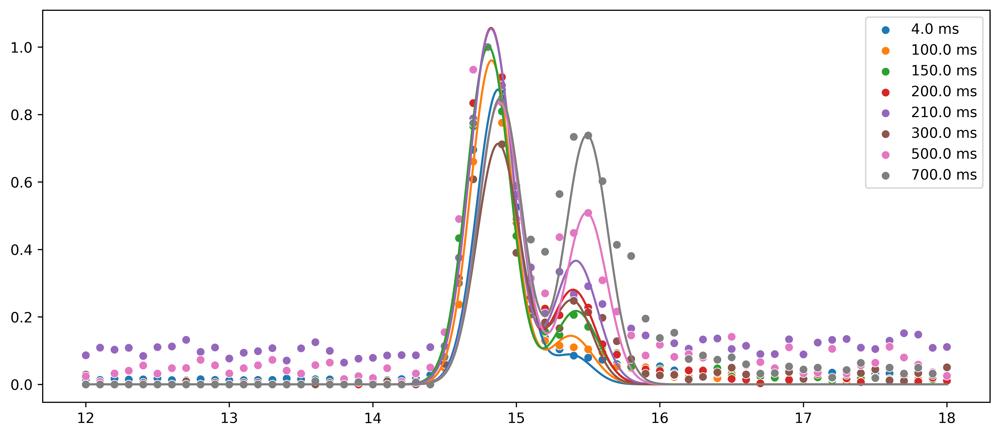

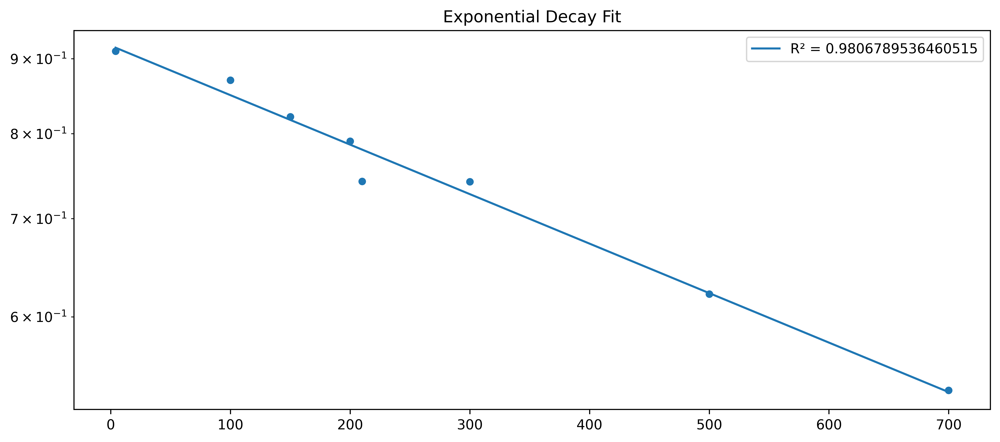

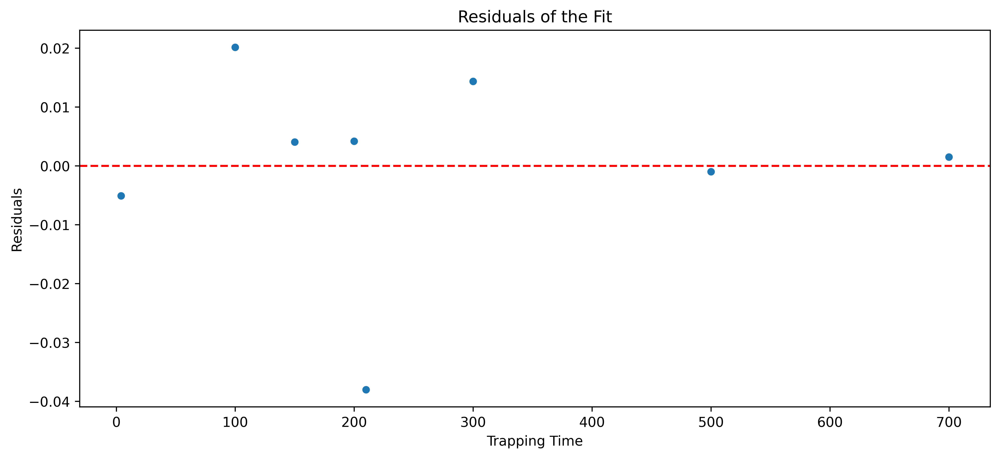

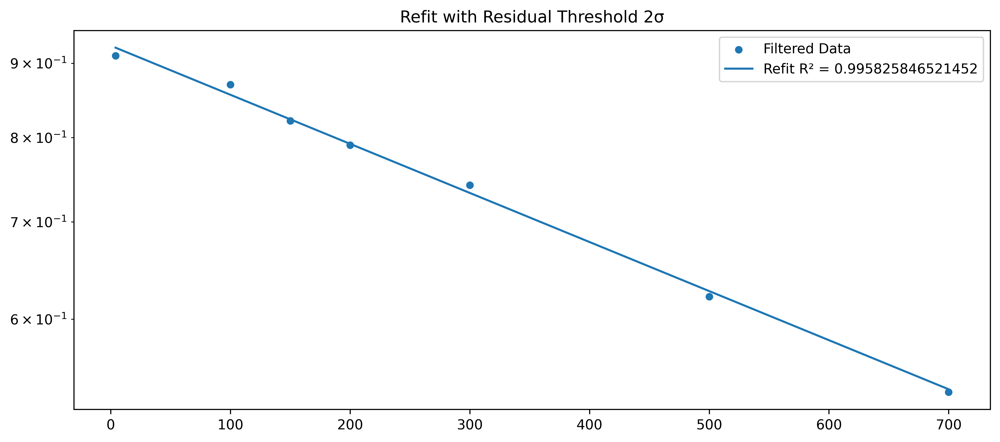

C:\Users\Thomas\anaconda3\Lib\site-packages\tables\path.py:137: NaturalNameWarning: object name is not a valid Python identifier: '157'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)


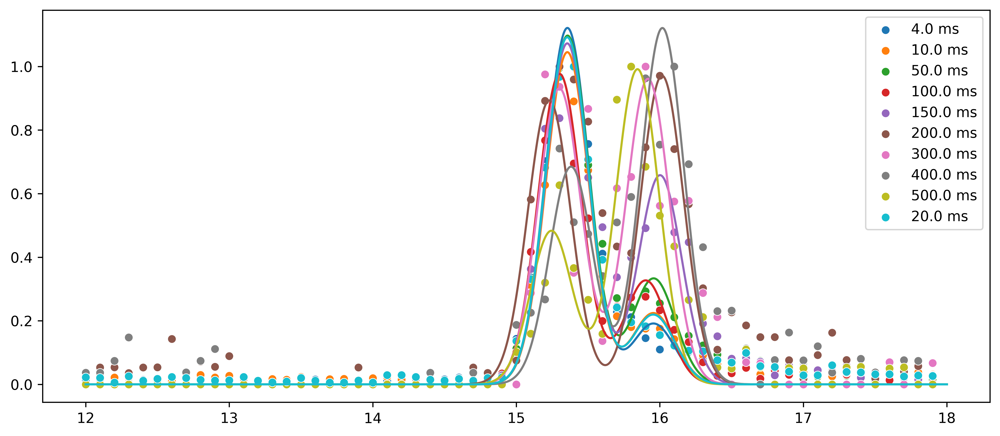

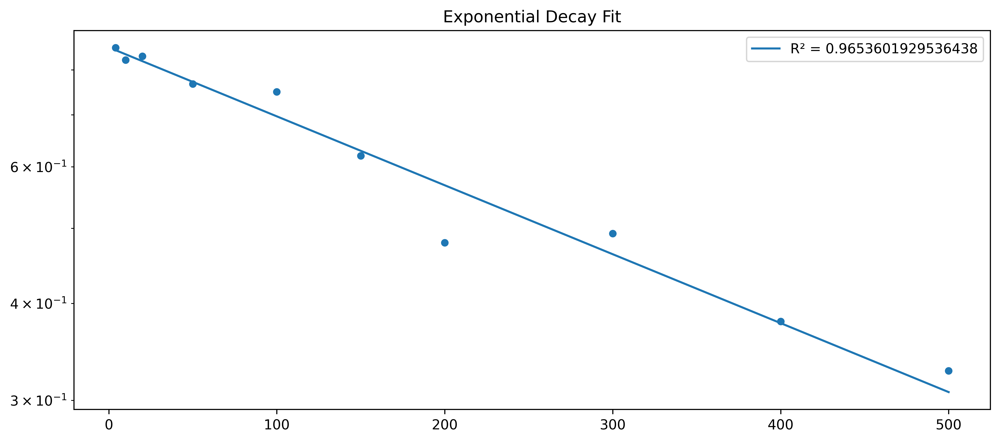

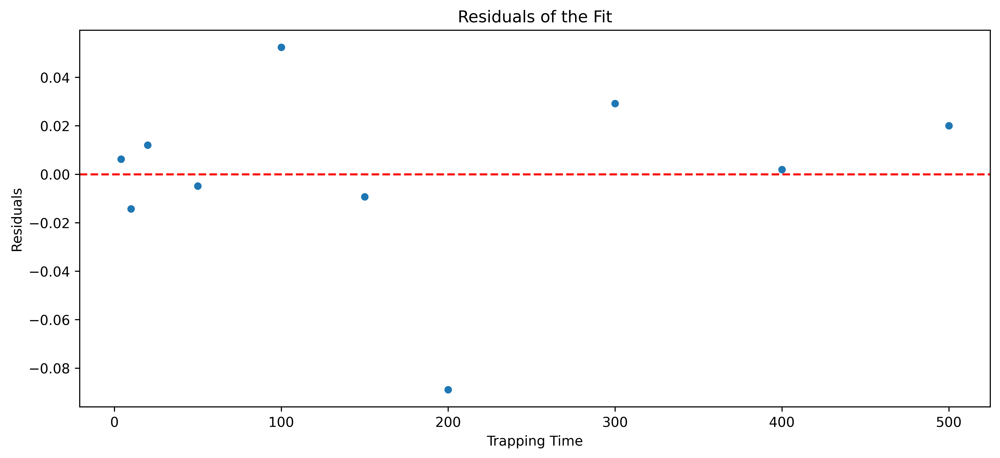

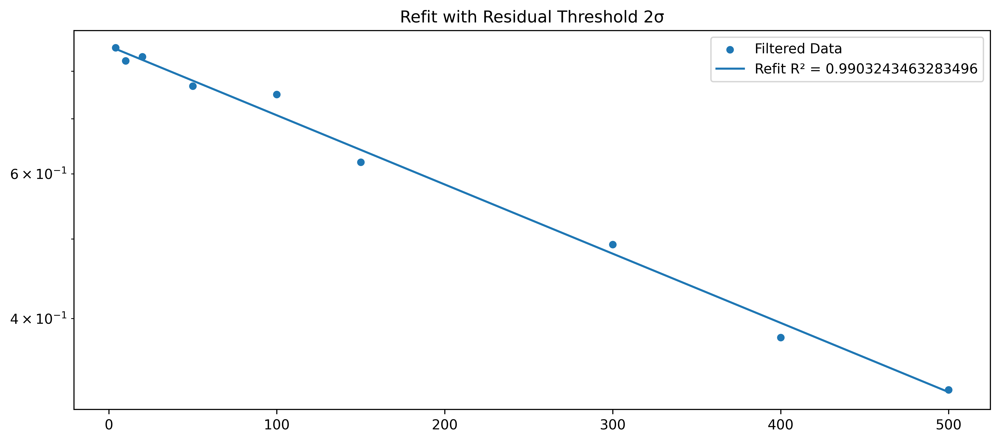

C:\Users\Thomas\anaconda3\Lib\site-packages\tables\path.py:137: NaturalNameWarning: object name is not a valid Python identifier: '174'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)


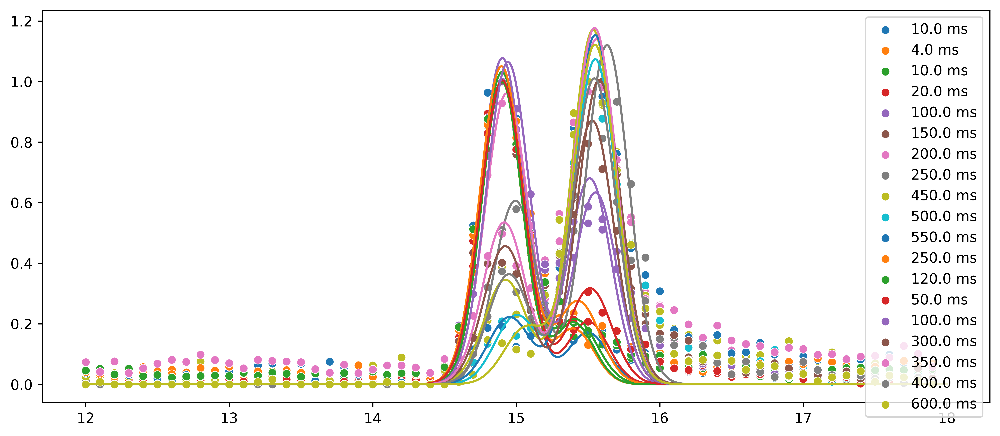

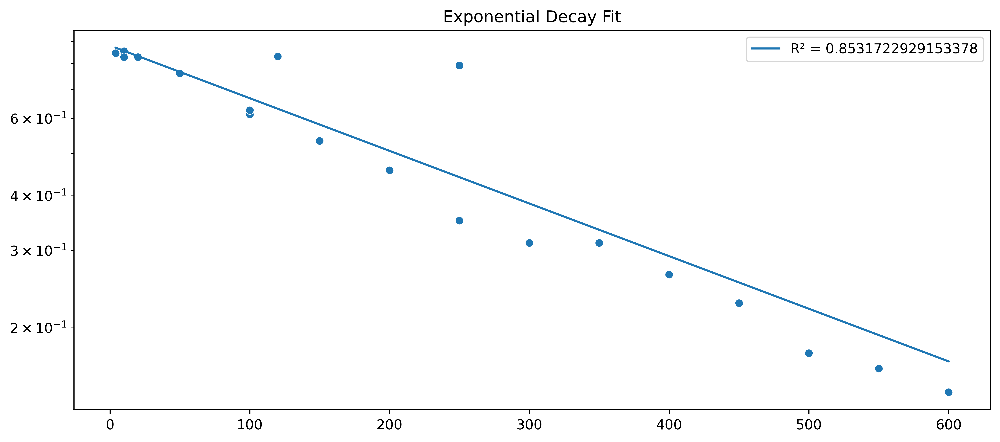

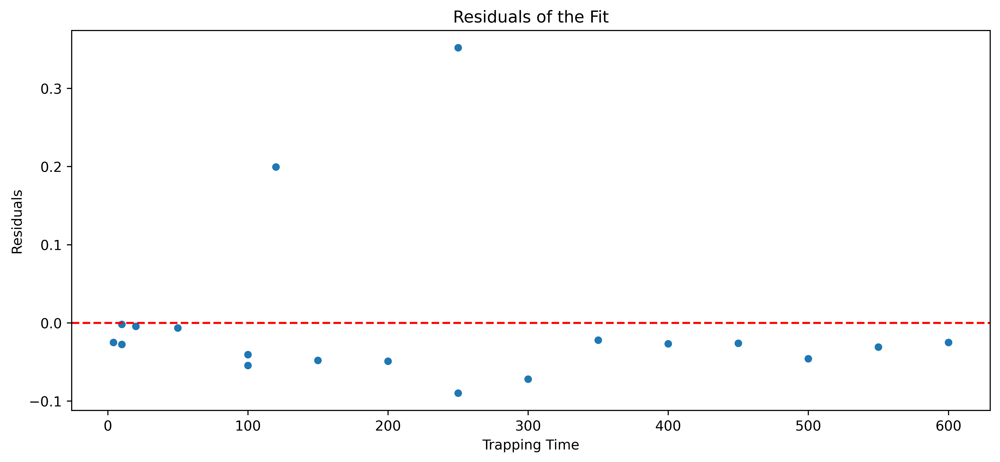

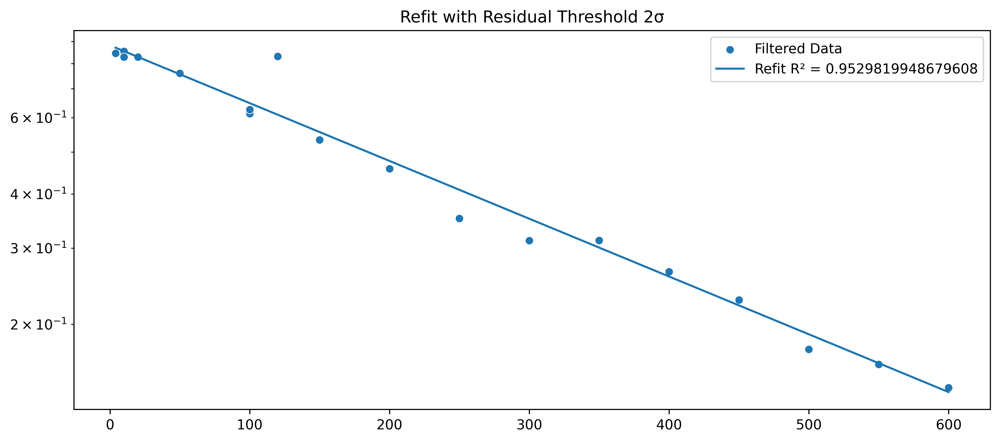

C:\Users\Thomas\anaconda3\Lib\site-packages\tables\path.py:137: NaturalNameWarning: object name is not a valid Python identifier: '184'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)


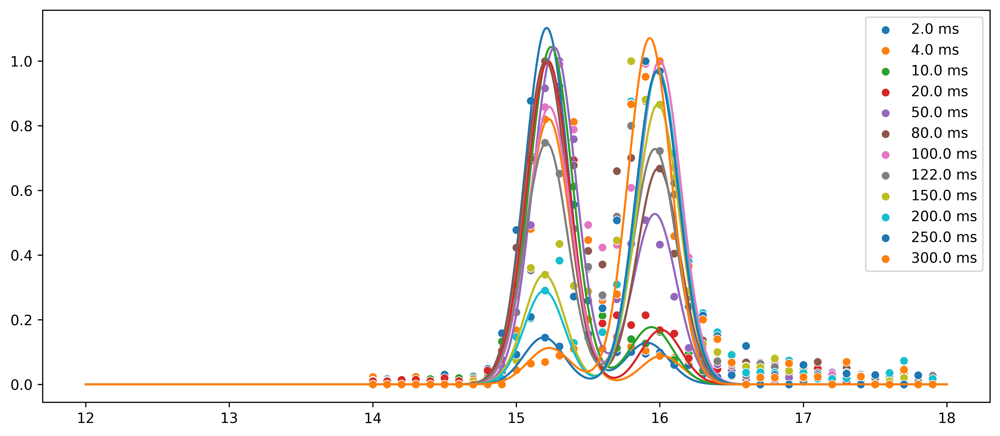

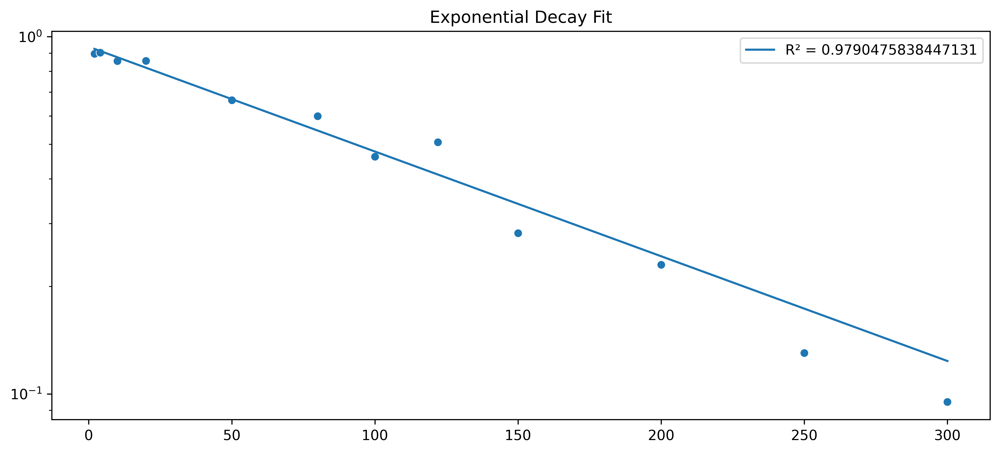

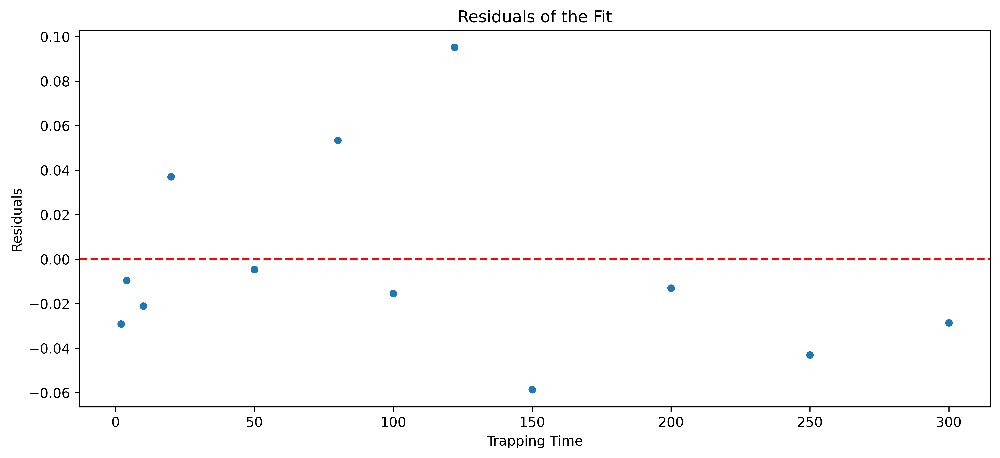

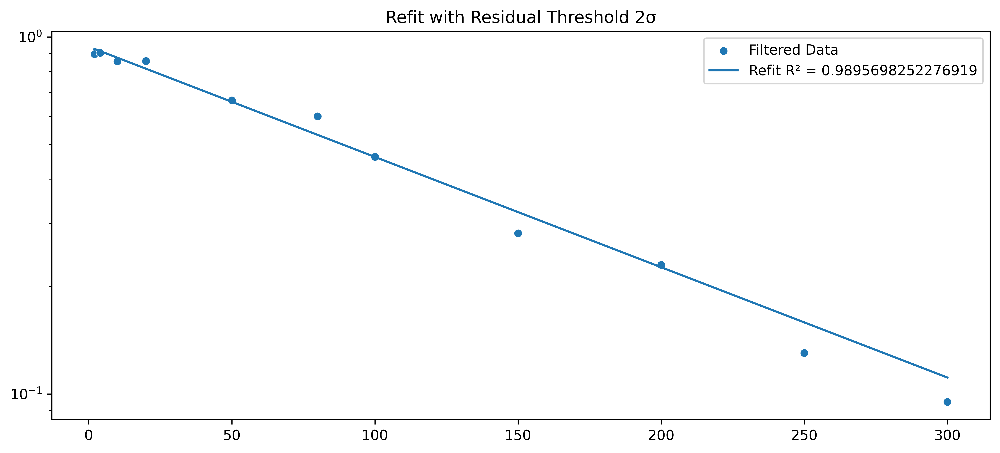

C:\Users\Thomas\anaconda3\Lib\site-packages\tables\path.py:137: NaturalNameWarning: object name is not a valid Python identifier: '193'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)


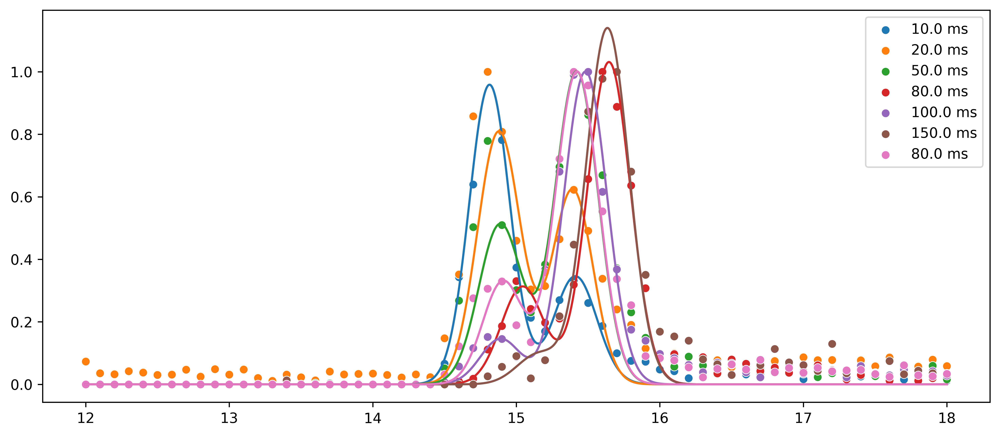

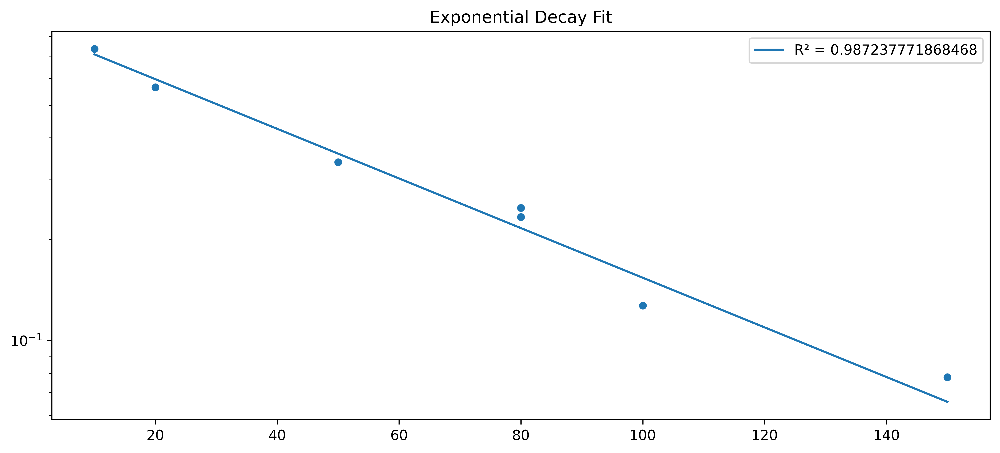

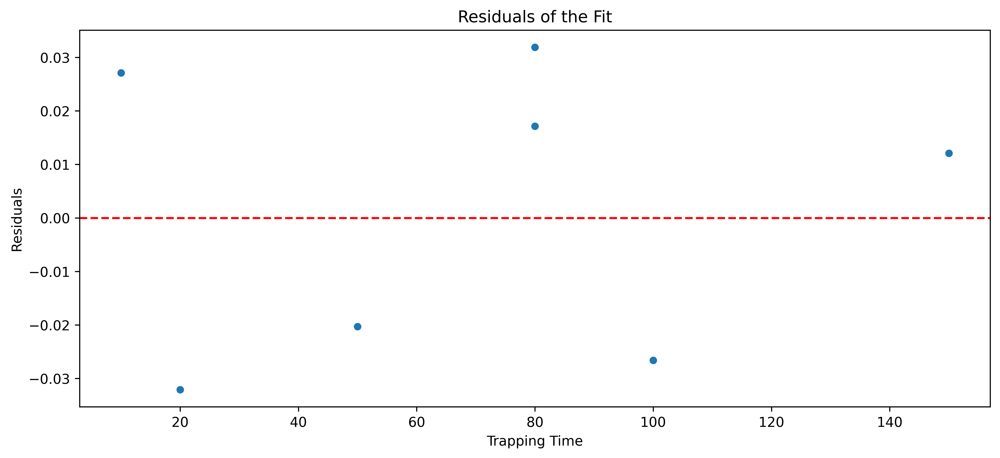

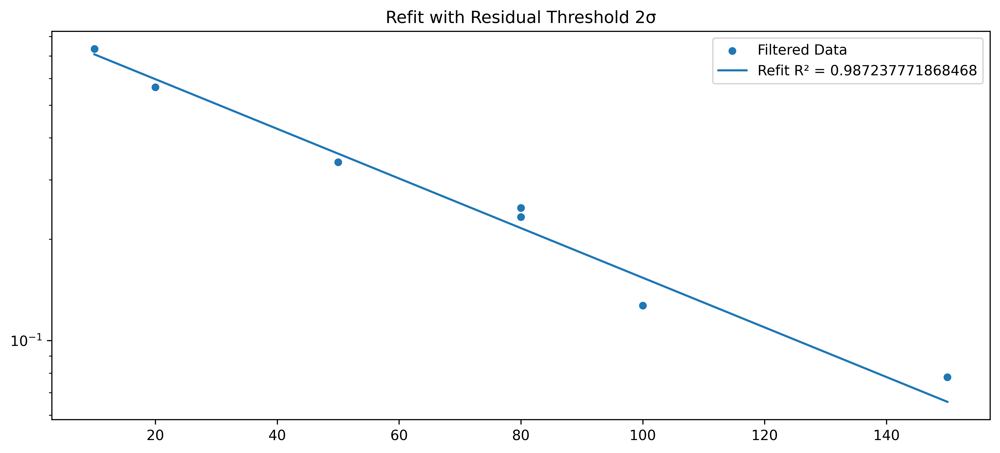

C:\Users\Thomas\anaconda3\Lib\site-packages\tables\path.py:137: NaturalNameWarning: object name is not a valid Python identifier: '214'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)


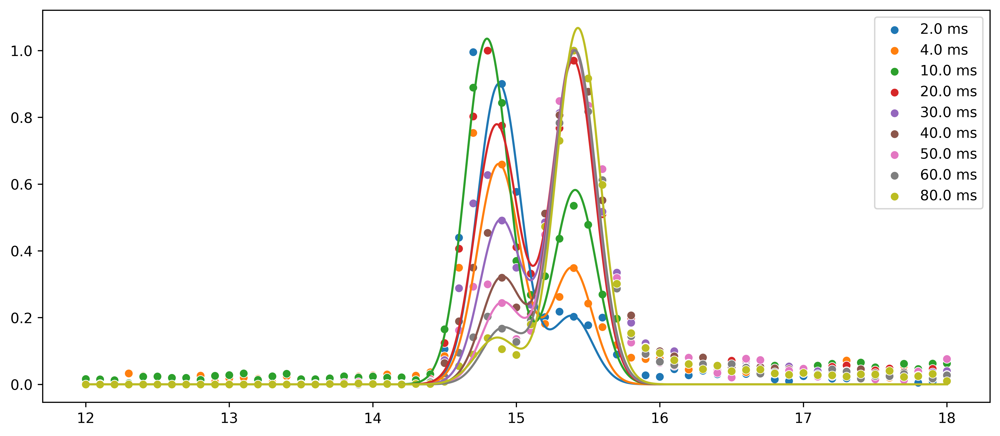

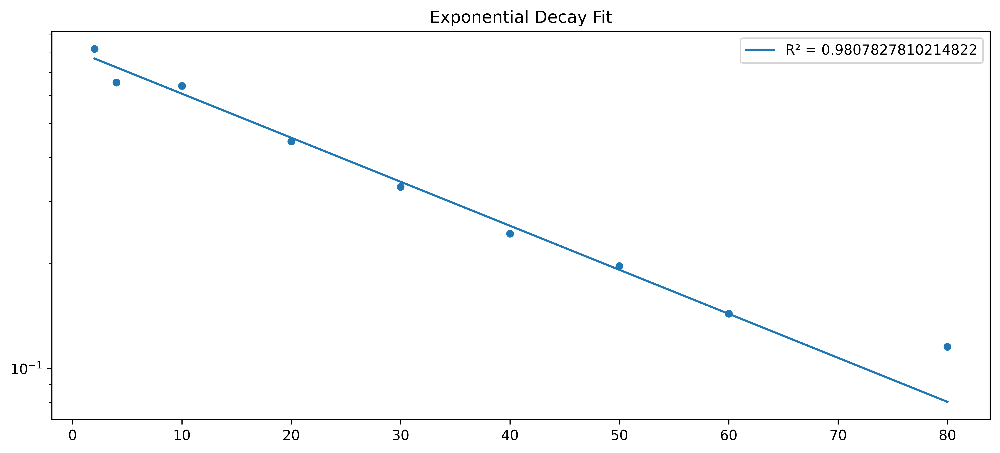

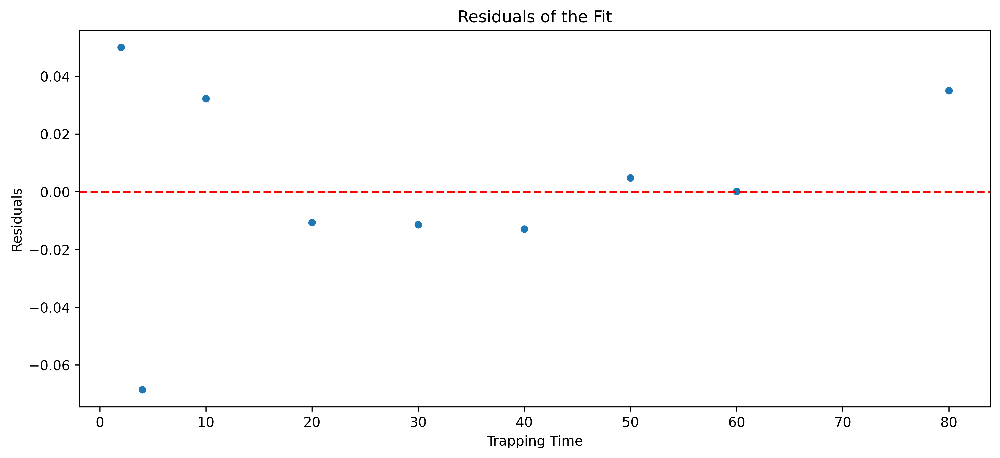

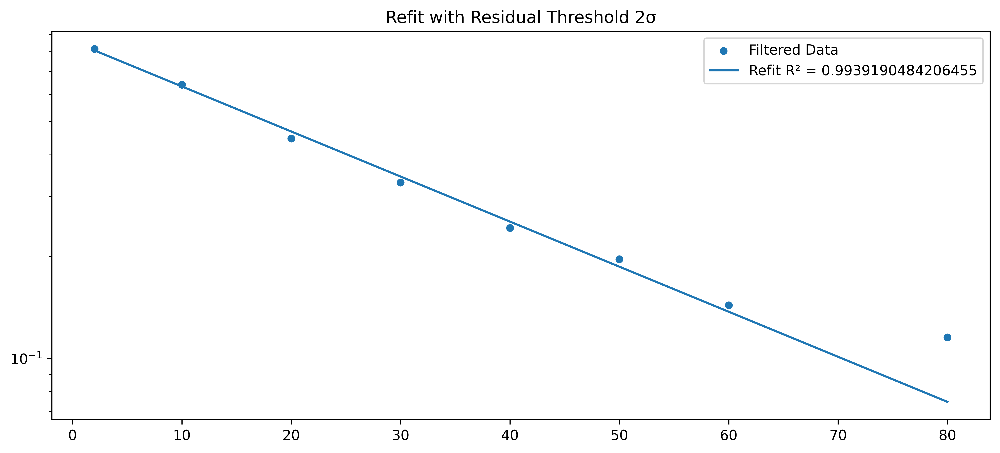

C:\Users\Thomas\anaconda3\Lib\site-packages\tables\path.py:137: NaturalNameWarning: object name is not a valid Python identifier: '224'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)


In [2]:
import h5py
from KIMETICS import *
from immstools.dataset import *

Temperature=[157, 174, 184, 193, 214, 224]

for i, temp in enumerate(Temperature):
    Trapping_time=[]
    Rel_intensities=[]
    fig, ax=plt.subplots(figsize=[12, 5], dpi=600)
    for file in files_2[i]:
        hdf=dataset(file)
        x, y = hdf.extractIM(mzRange=[584.0, 584.6], tdRange=[12, 18])
        y=y/y.max()
        param_value = hdf.getParamValue('Trap Delay')
        Trapping_time.append(param_value)
        sns.scatterplot(x=x, y=y, label=f'{param_value} ms')
        df = pd.DataFrame({
        "drift_time": x,
        "intensity": y
        })
        if temp==174:
            popt, perr, rep=fitData(df, peaks=[15.2, 16.0], sigmas=0.14, stol=0.01, ctol=0.1, baseline=0, Xshift=True, maxshift=0.2)
        elif temp==193:
            popt, perr, rep=fitData(df, peaks=[15.2, 16.0], sigmas=0.14, stol=0.01, ctol=0.05, baseline=0, Xshift=True, maxshift=2.0)
        else:
            popt, perr, rep=fitData(df, peaks=[14.87, 15.45], sigmas=0.14, stol=0.01, ctol=0.05, baseline=0, Xshift=True, maxshift=2.0)
        Rel_intensities.append(popt[0]/(popt[0]+popt[1]))
        x_fit=np.linspace(12, 18, 2000)
        y_fit=MultiGauss(x_fit, *popt)
        sns.lineplot(x=x_fit, y=y_fit)
    plt.show()

    def calculate_residuals(x, y, model_func, popt):
        y_pred = model_func(x, *popt)
        residuals = y - y_pred
        return residuals

    # Define the threshold for filtering points based on residuals
    def filter_points_by_residuals(x, y, residuals, threshold_factor=3):
        std_residuals = np.std(residuals)  # Compute standard deviation of residuals
        threshold = threshold_factor * std_residuals  # Define threshold
        mask = np.abs(residuals) <= threshold  # Keep points within the threshold
        return x[mask], y[mask]

    # 1. Fit the data
    fig, ax = plt.subplots(figsize=[12, 5], dpi=600)
    sns.scatterplot(x=Trapping_time, y=Rel_intensities)
    popt, perr, rep, r2 = fit_exponential_decay(Trapping_time, Rel_intensities, y0=0)
    x_fit = np.linspace(min(Trapping_time), max(Trapping_time), 2000)
    y_fit = exponential_decay(x_fit, popt[0], popt[1], popt[2])
    
    # 2. Plot the fitted line
    sns.lineplot(x=x_fit, y=y_fit, label=f'R² = {r2}')
    ax.set_yscale('log')
    plt.title('Exponential Decay Fit')
    plt.show()
    
    # Calculate residuals
    Trapping_time = np.array(Trapping_time)
    residuals = calculate_residuals(Trapping_time, Rel_intensities, exponential_decay, popt)

    # Plot residuals
    plt.figure(figsize=[12, 5], dpi=600)
    sns.scatterplot(x=Trapping_time, y=residuals)
    plt.axhline(0, color='red', linestyle='--')
    plt.title('Residuals of the Fit')
    plt.xlabel('Trapping Time')
    plt.ylabel('Residuals')
    plt.show()
    
    # Filter points with a threshold on residuals
    threshold_factor = 2  # For a threshold of 3 times the standard deviation
    Trapping_time_filtered, Rel_intensities_filtered = filter_points_by_residuals(
        np.array(Trapping_time), 
        np.array(Rel_intensities), 
        residuals, 
        threshold_factor
    )
    
    # Refit with the filtered data
    popt_filtered, perr_filtered, rep_filtered, r2_filtered = fit_exponential_decay(
        Trapping_time_filtered, Rel_intensities_filtered, y0=0
    )
    x_fit_filtered = np.linspace(min(Trapping_time_filtered), max(Trapping_time_filtered), 2000)
    y_fit_filtered = exponential_decay(x_fit_filtered, popt_filtered[0], popt_filtered[1], popt_filtered[2])
    
    # Plot the refitted data
    fig, ax = plt.subplots(figsize=[12, 5], dpi=600)
    sns.scatterplot(x=Trapping_time_filtered, y=Rel_intensities_filtered, label='Filtered Data')
    sns.lineplot(x=x_fit_filtered, y=y_fit_filtered, label=f'Refit R² = {r2_filtered}')
    ax.set_yscale('log')
    plt.title(f'Refit with Residual Threshold {threshold_factor}σ')
    plt.show()

    df = pd.DataFrame({
        'Trapping time': Trapping_time_filtered,
        'Relative intensity': Rel_intensities_filtered
    })

    with pd.HDFStore('NspeNspeN2tz_H_data.h5') as store:
        store[f'{temp}'] = df
    
    # fig, ax=plt.subplots(figsize=[12, 5], dpi=600)
    # sns.scatterplot(x=Trapping_time, y=Rel_intensities)
    # popt, perr, rep, r2=fit_exponential_decay(Trapping_time, Rel_intensities, y0=0)
    # x_fit=np.linspace(min(Trapping_time), max(Trapping_time), 2000)
    # y_fit=exponential_decay(x_fit, popt[0], popt[1], popt[2])
    # sns.lineplot(x=x_fit, y=y_fit, label=f'R² = {r2}')
    # ax.set_yscale('log')
    # print(r2)
    # plt.show()

# with h5py.File(file_path, "r") as hdf:
#     dataset = hdf["data"]
#     print(dataset.attrs.keys())  # List attributes
#     print(dataset.attrs["metadata"])
#     print(dataset.attrs["settings"])

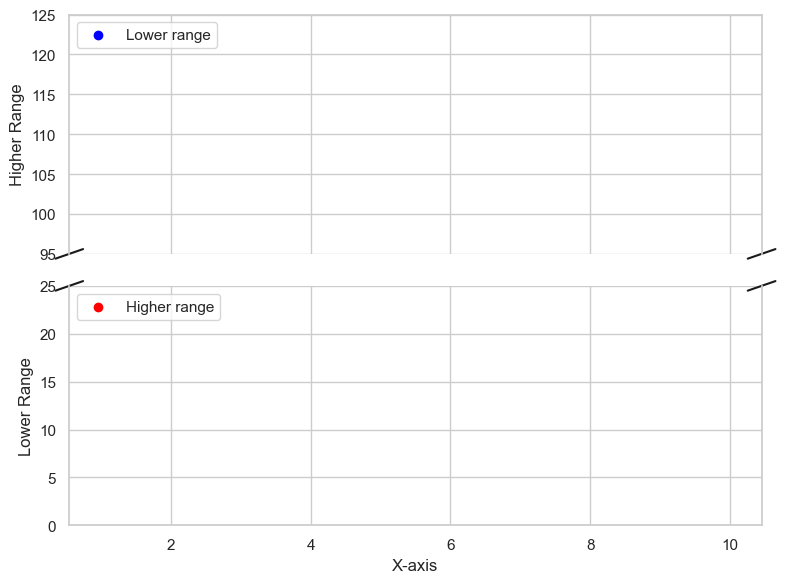

In [57]:
import matplotlib.pyplot as plt
import numpy as np

# Example data
x1 = np.linspace(1, 10, 10)
y1 = np.random.uniform(10, 20, 10)  # First dataset (lower range)

x2 = np.linspace(1, 10, 10)
y2 = np.random.uniform(100, 120, 10)  # Second dataset (higher range)

# Create the figure and two subplots
fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(8, 6), gridspec_kw={'height_ratios': [1, 1]})

# Plot both datasets
ax1.scatter(x1, y1, color='blue', label='Lower range')
ax2.scatter(x2, y2, color='red', label='Higher range')

# Adjust y-limits for better focus
ax1.set_ylim(95, 125)  # Set the range for the higher dataset
ax2.set_ylim(0, 25)    # Set the range for the lower dataset

# Add the "break" marks
ax1.spines['bottom'].set_visible(False)
ax2.spines['top'].set_visible(False)
ax1.tick_params(axis='x', which='both', bottom=False, labelbottom=False)
ax2.tick_params(axis='x', which='both', top=False)
d = 0.02  # Break size
kwargs = dict(transform=ax1.transAxes, color='k', clip_on=False)
ax1.plot((-d, +d), (-d, +d), **kwargs)  # Top-left diagonal
ax1.plot((1 - d, 1 + d), (-d, +d), **kwargs)  # Top-right diagonal

kwargs.update(transform=ax2.transAxes)  # Switch to ax2
ax2.plot((-d, +d), (1 - d, 1 + d), **kwargs)  # Bottom-left diagonal
ax2.plot((1 - d, 1 + d), (1 - d, 1 + d), **kwargs)  # Bottom-right diagonal

# Add labels and legend
ax2.set_xlabel('X-axis')
ax1.set_ylabel('Higher Range')
ax2.set_ylabel('Lower Range')
ax1.legend(loc='upper left')
ax2.legend(loc='upper left')

# Show the plot
plt.tight_layout()
plt.show()


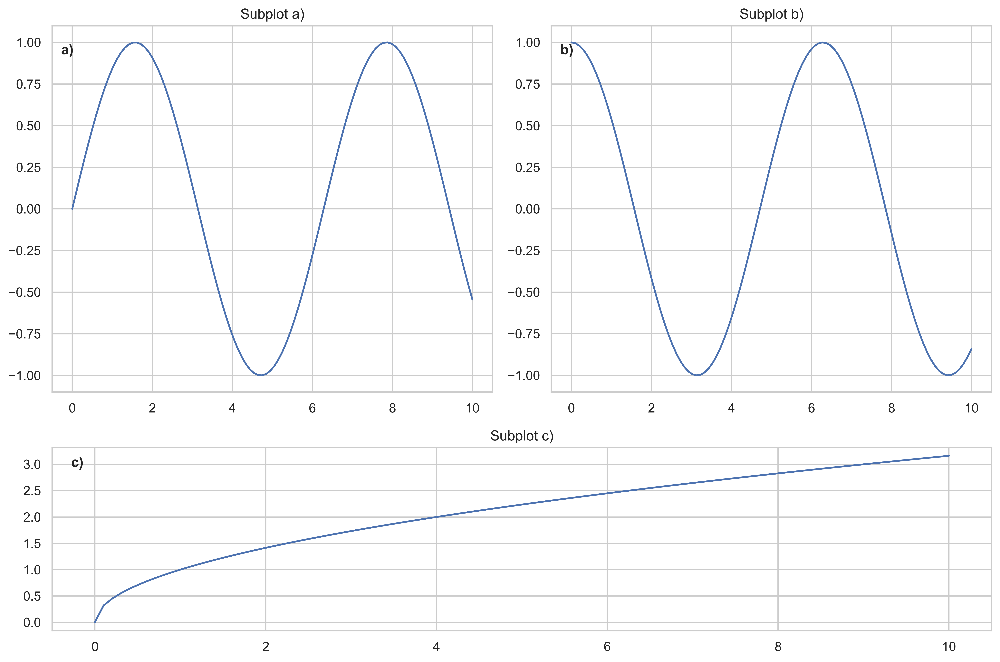

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Define the figure and grid specification
fig = plt.figure(figsize=(12, 8), dpi=600)
gs = fig.add_gridspec(2, 2, height_ratios=[1, 0.5])
sns.set(style="whitegrid")

# Create axes
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[1, :])

# Store axes in a list for enumeration
axes = [ax1, ax2, ax3]

# Add labels to each subplot
for idx, ax in enumerate(axes):
    ax.text(
        x=0.02, y=0.95,  # Position: top-left corner of the subplot
        s=f"{chr(97 + idx)})",  # Generate "a)", "b)", "c)" dynamically
        transform=ax.transAxes,  # Use axis-relative coordinates
        fontsize=12, weight="bold", ha="left", va="top"
    )
    ax.set_title(f"Subplot {chr(97 + idx)})")  # Optional: Titles for clarity

# Example plots
x = np.linspace(0, 10, 100)
ax1.plot(x, np.sin(x), label="Sine wave")
ax2.plot(x, np.cos(x), label="Cosine wave")
ax3.plot(x, x**0.5, label="Square root")

# Adjust layout and display
fig.tight_layout()
plt.show()


In [18]:
import numpy as np
from sklearn.linear_model import LinearRegression

# Example data
x = np.random.rand(100) * 10  # Random x values
y = 2.5 * x + np.random.randn(100) * 2  # Linear relation with noise

# Reshape x for sklearn
x = x.reshape(-1, 1)

# Fit the linear regression model
model = LinearRegression()
model.fit(x, y)
slope = model.coef_[0]
intercept = model.intercept_

# Calculate predictions
y_pred = model.predict(x)

# Calculate residuals
residuals = y - y_pred

# Residual variance (sigma^2)
n = len(y)  # Number of data points
p = 2       # Number of parameters (slope and intercept)
residual_variance = np.sum(residuals**2) / (n - p)

# Design matrix (X)
X = np.column_stack((np.ones_like(x), x))  # Add intercept term

# Covariance matrix of the parameters
XTX_inv = np.linalg.inv(X.T @ X)
param_covariance = residual_variance * XTX_inv

# Standard errors of slope and intercept
intercept_error = np.sqrt(param_covariance[0, 0])
slope_error = np.sqrt(param_covariance[1, 1])

print(f"Slope: {slope:.3f} ± {slope_error:.3f}")
print(f"Intercept: {intercept:.3f} ± {intercept_error:.3f}")


Slope: 2.461 ± 0.072
Intercept: 0.399 ± 0.407
